<a href="https://colab.research.google.com/github/nimran79/Spark-recommender/blob/main/music_recommendation_system.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initialize Google colab

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/My Drive/Colab Notebooks/Dataset"
os.chdir(path)
!ls

data_by_artist.csv  data_by_year.csv  data_w_genres.csv
data_by_genres.csv  data.csv


Install PySpark and JVM

In [ ]:
!pip install pyspark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 281.4 MB 42 kB/s 
     |████████████████████████████████| 199 kB 67.4 MB/s 
  Created wheel for pyspark: filename=pyspark-3.3.1-py2.py3-none-any.whl size=281845512 sha256=7657fe7c8c7d32c9186a0e96ae9b9ec82aa54071f016cfd5c6dd7d8f92d488f3
  Stored in directory: /root/.cache/pip/wheels/43/dc/11/ec201cd671da62fa9c5cc77078235e40722170ceba231d7598
Successfully built pyspark


# Create a Spark Session

In [ ]:
from pyspark.sql import SparkSession

spark = SparkSession.builder\
        .master("local[2]")\
        .appName("Music recommendation")\
        .config('spark.ui.port', '4050')\
        .getOrCreate()

In [ ]:
# get spark context
sc = spark.sparkContext

In [ ]:
spark

Here, we are using 2 local threads.

# Import Libraries

In [ ]:
from pyspark import SparkContext, SparkConf
from pyspark.sql import SQLContext
from pyspark.ml.feature import OneHotEncoder, StringIndexer, StandardScaler, VectorAssembler
from pyspark.ml.stat import Correlation
from pyspark.ml.linalg import Vectors
from pyspark.sql.functions import rand, col, udf, lit
from pyspark.mllib.evaluation import MulticlassMetrics

In [ ]:
import math
import time
import numpy as np
import pandas as pd

# visualization imports
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

# Load Data

In [ ]:
data = spark.read.csv('data.csv',inferSchema=True, header =True)
genre_data = spark.read.csv('data_by_genres.csv',inferSchema=True, header =True)
year_data = spark.read.csv('data_by_year.csv',inferSchema=True, header =True)

In [ ]:
# Loading data into Pandas
data_pd = pd.read_csv("data.csv")
genre_data_pd = pd.read_csv('data_by_genres.csv')
year_data_pd = pd.read_csv('data_by_year.csv')

### Inspect the Data

In [ ]:
# description of data 
data.summary().show()

+-------+-------------------+------------------+-------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+--------------------+------------------+------------------+----------------------+------------------+--------------------+--------------------+--------------------+
|summary|            valence|              year|       acousticness|             artists|        danceability|         duration_ms|              energy|            explicit|                  id|    instrumentalness|               key|            liveness|          loudness|              mode|                  name|        popularity|        release_date|         speechiness|               tempo|
+-------+-------------------+------------------+-------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------

In [ ]:
# Features
data.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: integer (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- artists: string (nullable = true)
 |-- danceability: string (nullable = true)
 |-- duration_ms: string (nullable = true)
 |-- energy: string (nullable = true)
 |-- explicit: string (nullable = true)
 |-- id: string (nullable = true)
 |-- instrumentalness: string (nullable = true)
 |-- key: string (nullable = true)
 |-- liveness: string (nullable = true)
 |-- loudness: string (nullable = true)
 |-- mode: string (nullable = true)
 |-- name: string (nullable = true)
 |-- popularity: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- speechiness: string (nullable = true)
 |-- tempo: string (nullable = true)



The machine learning model needs the data to be numbers so we are converting the features to floats.

In [ ]:
# Convert some columns to int or double
df = data.withColumn("danceability",data.danceability.cast('float'))
df = df.withColumn("year",data.year.cast('float'))
df = df.withColumn("duration_ms",data.duration_ms.cast('float'))
df = df.withColumn("energy",data.energy.cast('float'))
df = df.withColumn("explicit",data.explicit.cast('float'))
df = df.withColumn("instrumentalness",data.instrumentalness.cast('float'))
df = df.withColumn("key",data.key.cast('float'))
df = df.withColumn("liveness",data.liveness.cast('float'))
df = df.withColumn("loudness",data.loudness.cast('float'))
df = df.withColumn("mode",data.mode.cast('float'))
df = df.withColumn("popularity",data.popularity.cast('float'))
df = df.withColumn("speechiness",data.speechiness.cast('float'))
df = df.withColumn("tempo",data.tempo.cast('float'))

In [ ]:
df.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: float (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- artists: string (nullable = true)
 |-- danceability: float (nullable = true)
 |-- duration_ms: float (nullable = true)
 |-- energy: float (nullable = true)
 |-- explicit: float (nullable = true)
 |-- id: string (nullable = true)
 |-- instrumentalness: float (nullable = true)
 |-- key: float (nullable = true)
 |-- liveness: float (nullable = true)
 |-- loudness: float (nullable = true)
 |-- mode: float (nullable = true)
 |-- name: string (nullable = true)
 |-- popularity: float (nullable = true)
 |-- release_date: string (nullable = true)
 |-- speechiness: float (nullable = true)
 |-- tempo: float (nullable = true)



In [ ]:
# Look at first 3 rows
df.show(3)

+-------+----+------------+--------------------+------------------+-----------+------+--------+--------------------+----------------+---+--------+--------+----+--------------------+----------+------------+-----------+-----------------+
|valence|year|acousticness|             artists|      danceability|duration_ms|energy|explicit|                  id|instrumentalness|key|liveness|loudness|mode|                name|popularity|release_date|speechiness|            tempo|
+-------+----+------------+--------------------+------------------+-----------+------+--------+--------------------+----------------+---+--------+--------+----+--------------------+----------+------------+-----------+-----------------+
| 0.0594|1921|       0.982|['Sergei Rachmani...|             0.279|   831667.0| 0.211|       0|4BJqT0PrAfrxzMOxy...|           0.878| 10|   0.665| -20.096|   1|Piano Concerto No...|         4|        1921|     0.0366|           80.954|
|  0.963|1921|       0.732|      ['Dennis Day']|0.819000

In [ ]:
# Look at first 3 rows
genre_data.show(3)

+----+--------------------+------------------+-------------------+------------------+-------------------+------------------+--------+-------------------+-------------------+------------------+-------------------+-----------------+---+
|mode|              genres|      acousticness|       danceability|       duration_ms|             energy|  instrumentalness|liveness|           loudness|        speechiness|             tempo|            valence|       popularity|key|
+----+--------------------+------------------+-------------------+------------------+-------------------+------------------+--------+-------------------+-------------------+------------------+-------------------+-----------------+---+
|   1|21st century clas...|0.9793333333333332|0.16288333333333335|160297.66666666663|0.07131666666666665|        0.60683367|  0.3616|-31.514333333333337|0.04056666666666667|           75.3365|0.10378333333333334|27.83333333333333|  6|
|   1|               432hz|           0.49478| 0.29933333333

In [ ]:
# Look at first 3 rows
year_data.show(3)

+----+----+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+------------------+------------------+-------------------+-------------------+---+
|mode|year|      acousticness|      danceability|       duration_ms|             energy|   instrumentalness|          liveness|           loudness|       speechiness|             tempo|            valence|         popularity|key|
+----+----+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+------------------+------------------+-------------------+-------------------+---+
|   1|1921|0.8868960000000005|0.4185973333333336|260537.16666666663|0.23181513333333334|0.34487805886666656|           0.20571| -17.04866666666665|          0.073662|101.53149333333329|0.37932666666666665| 0.6533333333333333|  2|
|   1|1922|0.9385915492957748|0.4820422535211267|165469.74647887325|0.2378153521

# Exploratory Data Analysis

### Correlation Matrix

We are going to check the correlation between different features.

In [ ]:
# dropping string columns for calculating correlation
df2 = df.drop("artists","id","name","release_date")
df2.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: float (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- danceability: float (nullable = true)
 |-- duration_ms: float (nullable = true)
 |-- energy: float (nullable = true)
 |-- explicit: float (nullable = true)
 |-- instrumentalness: float (nullable = true)
 |-- key: float (nullable = true)
 |-- liveness: float (nullable = true)
 |-- loudness: float (nullable = true)
 |-- mode: float (nullable = true)
 |-- popularity: float (nullable = true)
 |-- speechiness: float (nullable = true)
 |-- tempo: float (nullable = true)



In [ ]:
df2.show(3)

+-------+----+------------+------------------+-----------+------+--------+----------------+---+--------+--------+----+----------+-----------+-----------------+
|valence|year|acousticness|      danceability|duration_ms|energy|explicit|instrumentalness|key|liveness|loudness|mode|popularity|speechiness|            tempo|
+-------+----+------------+------------------+-----------+------+--------+----------------+---+--------+--------+----+----------+-----------+-----------------+
| 0.0594|1921|       0.982|             0.279|   831667.0| 0.211|       0|           0.878| 10|   0.665| -20.096|   1|         4|     0.0366|           80.954|
|  0.963|1921|       0.732|0.8190000000000001|   180533.0| 0.341|       0|             0.0|  7|    0.16| -12.441|   1|         5|      0.415|60.93600000000001|
| 0.0394|1921|       0.961|             0.328|   500062.0| 0.166|       0|           0.913|  3|   0.101|  -14.85|   1|         5|     0.0339|          110.339|
+-------+----+------------+-------------

In [ ]:
assembler =  VectorAssembler(inputCols=df2.columns, outputCol= "corr-features")

In [ ]:
#df2_vector = assembler.transform(df2).select("corr-features")
df2_vector = assembler.setHandleInvalid("skip").transform(df2).select("corr-features")

In [ ]:
df2_vector.select("corr-features").show(truncate=False)

+--------------------------------------------------------------------------------------------------------------------------------+
|corr-features                                                                                                                   |
+--------------------------------------------------------------------------------------------------------------------------------+
|[0.0594,1921.0,0.982,0.279,831667.0,0.211,0.0,0.878,10.0,0.665,-20.096,1.0,4.0,0.0366,80.954]                                   |
|[0.963,1921.0,0.732,0.8190000000000001,180533.0,0.341,0.0,0.0,7.0,0.16,-12.441,1.0,5.0,0.415,60.93600000000001]                 |
|[0.0394,1921.0,0.961,0.328,500062.0,0.166,0.0,0.913,3.0,0.101,-14.85,1.0,5.0,0.0339,110.339]                                    |
|[0.165,1921.0,0.967,0.275,210000.0,0.309,0.0,2.77E-5,5.0,0.381,-9.316,1.0,3.0,0.0354,100.109]                                   |
|[0.253,1921.0,0.957,0.418,166693.0,0.193,0.0,1.68E-6,3.0,0.229,-10.096,1.0,2.0,0.0

In [ ]:
pearsonCorr = Correlation.corr(df2_vector, "corr-features").collect()[0][0]
corr_matrix = pearsonCorr.toArray().tolist()
#print(corr_matrix)

In [ ]:
df2_corr = spark.createDataFrame(corr_matrix, df2.columns)
df2_corr.show()

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|             valence|                year|        acousticness|        danceability|         duration_ms|              energy|            explicit|    instrumentalness|                 key|            liveness|            loudness|                mode|          popularity|         speechiness|               tempo|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|                 1.0|-0.03541654944128016|-0.176

### Heat Map

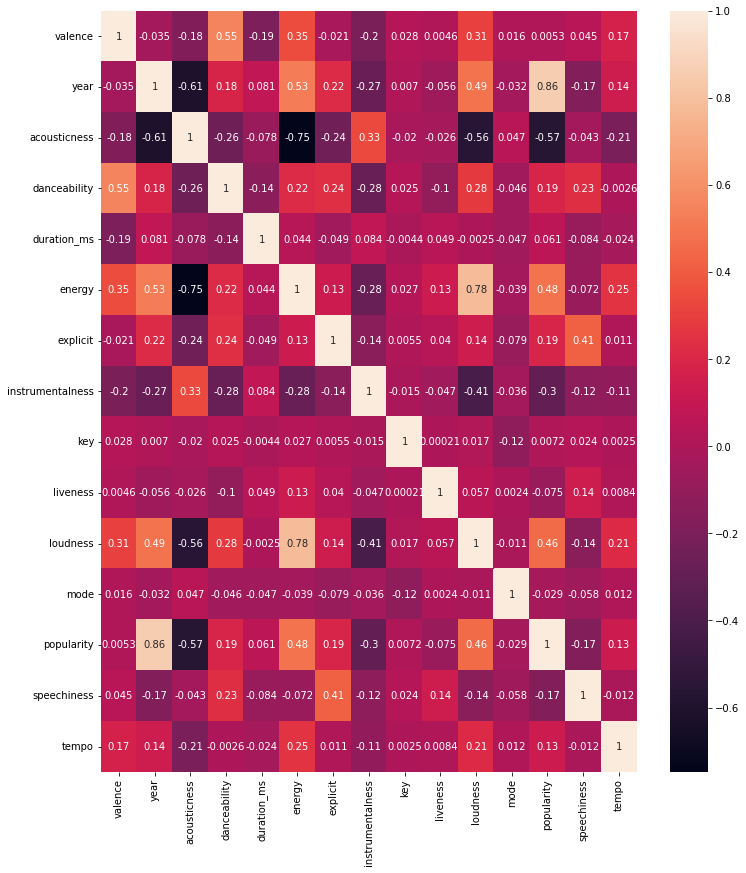

In [ ]:
#specify size of heatmap
fig, ax = plt.subplots(figsize=(12, 14))
sns.heatmap(corr_matrix, xticklabels=df2_corr.columns, yticklabels=df2_corr.columns, annot=True) 

### Music by Year

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

In [ ]:
decadeUDF = udf(lambda z:get_decade(z))   
df_temp = df.withColumn("decade", decadeUDF(col("year")))

In [ ]:
df_temp.show(3)

+-------+----+------------+--------------------+------------------+-----------+------+--------+--------------------+----------------+---+--------+--------+----+--------------------+----------+------------+-----------+-----------------+------+
|valence|year|acousticness|             artists|      danceability|duration_ms|energy|explicit|                  id|instrumentalness|key|liveness|loudness|mode|                name|popularity|release_date|speechiness|            tempo|decade|
+-------+----+------------+--------------------+------------------+-----------+------+--------+--------------------+----------------+---+--------+--------+----+--------------------+----------+------------+-----------+-----------------+------+
| 0.0594|1921|       0.982|['Sergei Rachmani...|             0.279|   831667.0| 0.211|       0|4BJqT0PrAfrxzMOxy...|           0.878| 10|   0.665| -20.096|   1|Piano Concerto No...|         4|        1921|     0.0366|           80.954| 1920s|
|  0.963|1921|       0.732| 

In [ ]:
# convert to pandas dataframe for plotting
pandasDF = df_temp.toPandas()
pandasDF2 = year_data.toPandas()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


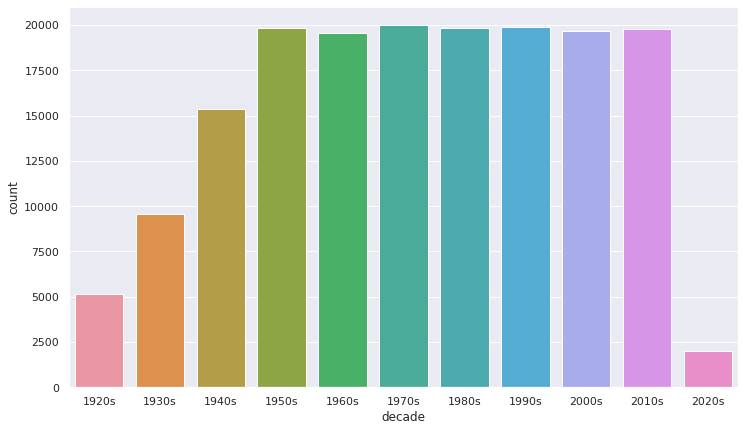

In [ ]:
sns.set(rc={'figure.figsize':(12 ,7)})
sns.countplot(pandasDF["decade"])

### Music by various sound properties

In [ ]:
import plotly.express as px 

In [ ]:
# Excluding other features such as 'tempo' because of different data distribution
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(pandasDF2, x='year', y=sound_features)
fig.show()

# Recommendation System

## Spark Implementation

In [ ]:
from pyspark.ml.clustering import KMeans
from pyspark.ml import Pipeline
from pyspark.ml.feature import StandardScaler
from pyspark.ml.evaluation import ClusteringEvaluator

In [ ]:
# Configure stages for the Spark pipeline
#stage1 = StandardScaler()
#stage2 = KMeans(k=10)

# Create cluster pipeline in Spark
#song_cluster_pipeline2 = Pipeline(stages=[stage1, stage2])

#X_sp = spark.createDataFrame(X_pd)  # Create spark dframe with only numeric columns
#number_cols_sp = list(X_sp.columns)

In [ ]:
FEATURES_COL = df2.columns
FEATURES_COL

['valence',
 'year',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'explicit',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'popularity',
 'speechiness',
 'tempo']

In [ ]:
df2 = df2.na.drop()

In [ ]:
vecAssembler = VectorAssembler(inputCols=FEATURES_COL, outputCol="features")
df_kmeans = vecAssembler.transform(df2).select('features') 
df_kmeans.show(5)

+--------------------+
|            features|
+--------------------+
|[0.0594,1921.0,0....|
|[0.963,1921.0,0.7...|
|[0.0394,1921.0,0....|
|[0.165,1921.0,0.9...|
|[0.253,1921.0,0.9...|
+--------------------+
only showing top 5 rows



### Clustering Songs

In [ ]:
# For counting time
start = time.time()
print("Starting timer...")

Starting timer...


In [ ]:
kmeans_cluster = KMeans().setK(8).setSeed(1)  # Setting cluster size to 8 based on elbow (below)

In [ ]:
model = kmeans_cluster.fit(df_kmeans)

In [ ]:
predictions = model.transform(df_kmeans)
predictions.show()

+--------------------+----------+
|            features|prediction|
+--------------------+----------+
|[0.0594,1921.0,0....|         2|
|[0.963,1921.0,0.7...|         0|
|[0.0394,1921.0,0....|         1|
|[0.165,1921.0,0.9...|         0|
|[0.253,1921.0,0.9...|         0|
|[0.196,1921.0,0.5...|         7|
|[0.406,1921.0,0.9...|         0|
|[0.0731,1921.0,0....|         0|
|[0.721,1921.0,0.9...|         0|
|[0.77099999999999...|         0|
|[0.826,1921.0,0.9...|         6|
|[0.578,1921.0,0.9...|         0|
|[0.493,1921.0,0.9...|         0|
|[0.212,1921.0,0.9...|         0|
|[0.493,1921.0,0.0...|         0|
|[0.282,1921.0,0.9...|         5|
|[0.218,1921.0,0.9...|         0|
|[0.664,1921.0,0.9...|         5|
|[0.0778,1921.0,0....|         0|
|[0.527,1921.0,0.9...|         6|
+--------------------+----------+
only showing top 20 rows



### Silhouette Score (for evaluation)

In [ ]:
evaluator = ClusteringEvaluator()

In [ ]:
silhouette_8_clusters = evaluator.evaluate(predictions)
print("Silhouette Score = " + str(silhouette_8_clusters))

Silhouette Score = 0.6796477580046763


In [ ]:
# For counting time
end = time.time()
print("Total time taken for Spark Kmeans Implementation: ", end - start)

Total time taken for Spark Kmeans Implementation:  21.976699352264404


### Finding optimal k

To find the optimal value of 'k' we cluster a fraction of the data for different choices of k and look for an "elbow" in the cost function

In [ ]:
cost = np.zeros(20)
for k in range(2,20):
    kmeans_cluster = KMeans().setK(k).setSeed(42)
    model = kmeans_cluster.fit(df_kmeans)
    predictions = model.transform(df_kmeans)
    evaluator = ClusteringEvaluator()
    cost[k] = evaluator.evaluate(predictions)

Exception ignored in: <function JavaWrapper.__del__ at 0x7f3037951e50>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/pyspark/ml/wrapper.py", line 53, in __del__
    if SparkContext._active_spark_context and self._java_obj is not None:
AttributeError: 'KMeans' object has no attribute '_java_obj'


Text(0.5, 1.0, 'Elbow method calculation')

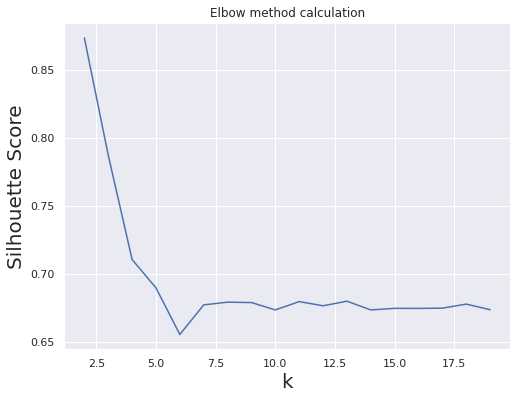

In [ ]:
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(2,20),cost[2:20])
ax.set_xlabel('k', fontsize = 20)
ax.set_ylabel('Silhouette Score', fontsize = 20)
plt.title('Elbow method calculation')

In [ ]:
# fit the pipeline model and transform the data as defined
#pipeline_model = song_cluster_pipeline2.fit(X_sp)
#df_updated = pipeline_model.transform(X_sp)

# view the transformed data
#df_updated.show()

## Pandas Implementation

### Clusters by Genre

here, K-means clustering is applied to find 15 clusters based on the numerical audio features of each genres.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=15))])
X_pd = genre_data_pd.select_dtypes(np.number)
cluster_pipeline.fit(X_pd)
genre_data_pd['cluster'] = cluster_pipeline.predict(X_pd)

In [ ]:
# Visualizing the Clusters with t-SNE
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X_pd)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data_pd['genres']
projection['cluster'] = genre_data_pd['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.252s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.816949
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.381668
[t-SNE] KL divergence after 1000 iterations: 1.127699


### Clusters of Songs

In [ ]:
# For counting time
start = time.time()
print("Starting timer...")

Starting timer...


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

# Create cluster pipeline in Pandas
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=8, verbose=False))], 
                                   verbose=False)

X_pd = data_pd.select_dtypes(np.number)
number_cols = list(X_pd.columns)

# Only fit based on the columns that have numbers as values
song_cluster_pipeline.fit(X_pd)
song_cluster_labels = song_cluster_pipeline.predict(X_pd)
data_pd['cluster_label'] = song_cluster_labels

In [ ]:
X_pd.head()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,cluster_label
0,0.0594,1921,0.982,0.279,831667,0.211,0,0.878000,10,0.665,-20.096,1,4,0.0366,80.954,9
1,0.9630,1921,0.732,0.819,180533,0.341,0,0.000000,7,0.160,-12.441,1,5,0.4150,60.936,3
2,0.0394,1921,0.961,0.328,500062,0.166,0,0.913000,3,0.101,-14.850,1,5,0.0339,110.339,9
3,0.1650,1921,0.967,0.275,210000,0.309,0,0.000028,5,0.381,-9.316,1,3,0.0354,100.109,0
4,0.2530,1921,0.957,0.418,166693,0.193,0,0.000002,3,0.229,-10.096,1,2,0.0380,101.665,0


### Silhouette Score (for evaluation)

In [ ]:
Sil_score = silhouette_score(X_pd, song_cluster_labels)
print("For 10 real clusters, Kmeans Silhouette score: ", round(Sil_score,3))

For 10 real clusters, Kmeans Silhouette score:  -0.19


In [ ]:
# For counting time
end = time.time()
print("Total time taken for Pandas Kmeans Implementation: ", end - start)

Total time taken for Pandas Kmeans Implementation:  265.7018666267395


In [ ]:
# Visualizing the Clusters with PCA
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X_pd)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data_pd['name']
projection['cluster'] = data_pd['cluster_label']

fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

## Recommending Songs

In [ ]:
from collections import defaultdict
#from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo','cluster_label']


def get_song_data(song, spotify_data):
    song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                  & (spotify_data['year'] == song['year'])].iloc[0]
    return song_data
           

def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict

In [ ]:
# Function for recommending songs
# song_list = recommend songs related to these songs
# spotify_data =  Training data
# n_songs = Number of songs to recommend (may not recommed enough if input cluster is small)

def recommend_songs(song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
%%capture --no-display
# Make sure the song name and year comes from the 'data.csv' file
recommend_songs([{'name': 'Breakfast At Tiffany\'s', 'year':1995},
                 {'name': 'Come As You Are', 'year':1991},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'No Excuses', 'year': 1994}],  data_pd)

[{'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"},
 {'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"},
 {'name': 'Smells Like Teen Spirit', 'year': 1991, 'artists': "['Nirvana']"},
 {'name': "Club Can't Handle Me (feat. David Guetta)",
  'year': 2010,
  'artists': "['Flo Rida', 'David Guetta']"},
 {'name': "When You're Gone",
  'year': 1998,
  'artists': "['Bryan Adams', 'Melanie C']"},
 {'name': 'Wake Me Up', 'year': 2013, 'artists': "['Avicii']"},
 {'name': 'Beauty And A Beat',
  'year': 2012,
  'artists': "['Justin Bieber', 'Nicki Minaj']"},
 {'name': 'Gold on the Ceiling',
  'year': 2011,
  'artists': "['The Black Keys']"}]